<a href="https://colab.research.google.com/github/su-0924/food-or-drink/blob/main/drink_food.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import shutil
from glob import glob
from PIL import Image
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_curve, auc, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import cv2
import torch
from torch import nn, optim
from torchvision import datasets, transforms, models
from torchvision.models import VGG16_BN_Weights
from torch.utils.data import DataLoader, random_split, Subset
from tqdm.notebook import tqdm

In [2]:
# 0: drink, 1: food

# 作業ディレクトリ
base_dir = os.path.join('/content', 'drive', 'MyDrive', 'SIGNATE')
# データの読み込み
train_df = pd.read_csv(os.path.join(base_dir, 'train.csv'))
train_df

,image_name,label
0,0000.png,0
1,0001.png,1
2,0002.png,1
3,0003.png,1
4,0004.png,0
...,...,...
2171,2171.png,1
2172,2172.png,1
2173,2173.png,1
2174,2174.png,0


In [3]:
# 訓練データのディレクトリを指定
train_dir = os.path.join(base_dir, 'train')
# テストデータのディレクトリを指定
test_dir = os.path.join(base_dir, 'test')
# 新規ディレクトリの作成
drink_dir = os.path.join(train_dir, 'drink')
food_dir = os.path.join(train_dir, 'food')

In [ ]:
# ----- trainフォルダをラベルごとに分ける（`datasets.ImageFolder`で扱えるようにするため） ----- #
# drinkフォルダが存在しなければ作成
if not os.path.exists(drink_dir):
  os.makedirs(drink_dir)
# foodフォルダが存在しなければ作成
if not os.path.exists(food_dir):
  os.makedirs(food_dir)
# 画像データの振り分け
for _, data in train_df.iterrows():
  if data['label'] == 0:
    shutil.move(os.path.join(train_dir, data['image_name']), drink_dir)
  else:
    shutil.move(os.path.join(train_dir, data['image_name']), food_dir)

# ----- testフォルダをラベルごとに分ける（`datasets.ImageFolder`で扱えるようにするため） ----- #
# 新規ディレクトリの作成
dummy_dir = os.path.join(test_dir, 'dummy_class')
# dummy_classフォルダが存在しなければ作成
if not os.path.exists(dummy_dir):
  os.makedirs(dummy_dir)
# testデータのpathを取得
test_image_paths = glob(test_dir + '/*.png')
for test_image_path in test_image_paths:
  # 画像データの移動
  shutil.move(test_image_path, dummy_dir)

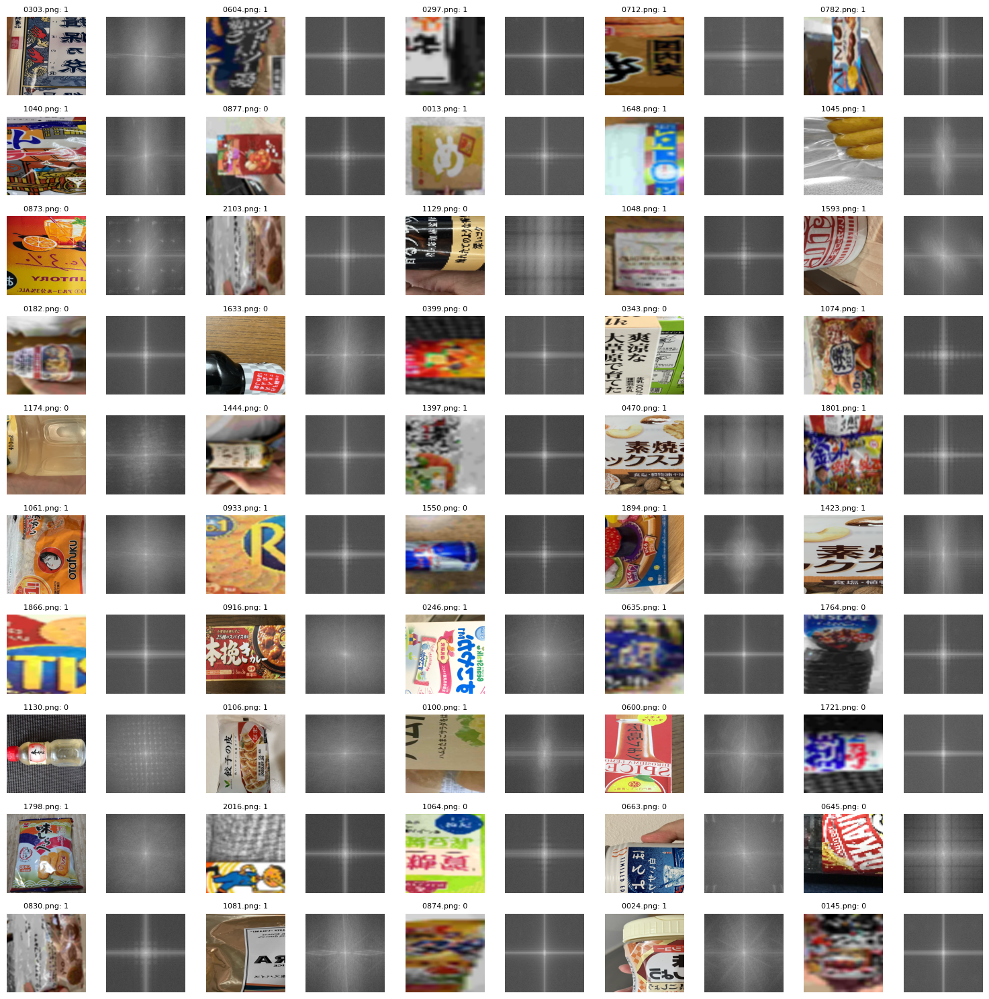

In [ ]:
# drinkとfoodのpathを取得
drink_file_paths = glob(os.path.join(drink_dir, '*.png'))
food_file_paths = glob(os.path.join(food_dir, '*.png'))
# drinkとfoodのpathを合算
train_file_paths = drink_file_paths + food_file_paths
# ランダムにtrain_file_pathsを取得
choice_train_file_paths = random.sample(train_file_paths, 50)

def plot_images(choice_train_file_paths):
  # 画像出力
  plt.figure(figsize=(15, 15))
  for i, image_path in enumerate(choice_train_file_paths):
    # ファイルの読み込み
    gray_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    color_image = cv2.imread(image_path)
    # BGR -> RGB に変換
    color_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2RGB)
    # 2Dフーリエ変換
    f = np.fft.fft2(gray_image)
    fshift = np.fft.fftshift(f)
    # パワースペクトルの計算
    magnitude_spectrum = np.log(np.abs(fshift))
    # ラベルの取得
    image_name = image_path.split('/')[-1]
    label = train_df[train_df['image_name'] == image_name]['label'].values[0]

    # カラー画像の表示
    ax = plt.subplot(10, 10, i*2+1)
    ax.set_title(f'{image_name}: {label}', fontsize=8)
    ax.imshow(color_image)
    ax.axis('off')

    # 周波数領域の分析結果
    ax = plt.subplot(10, 10, i*2+2)
    ax.imshow(magnitude_spectrum, cmap='gray')  # グレースケールで表示
    ax.axis('off')

  plt.tight_layout()
  plt.show()

plot_images(choice_train_file_paths)

In [ ]:
# 異常値と画像サイズの確認
for i, image_path in enumerate(train_file_paths):
  # 画像の読み込み
  image = cv2.imread(image_path)
  # 画像サイズの取得
  image_shape = image.shape
  # 異常時判定
  if (0 > image.min()) or (image.max() > 255):
    print(f'異常値のpath: {image_path}')
  if image_shape != (512, 512, 3):
    print(f'指定した画像サイズ以外のpath: {image_path}')

交差検証を用いて実装

In [4]:
# デバイスの割り当て
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda', index=0)

In [8]:
## 使用する関数の定義 ##

# ------------------------------------------------------------- PyTorch乱数固定 ------------------------------------------------------------- #
def torch_seed(seed=0):

  torch.manual_seed(seed)
  torch.cuda.manual_seed(seed)
  torch.backends.cudnn.deterministic = True
  torch.use_deterministic_algorithms = True

# ----------------------------------------------------------------------- モデルの学習 ----------------------------------------------------------------------- #
def fit(net, criterion, optimizer, num_epochs, train_loader, val_loader, device, history, base_dir, fold, thresholds=0.5):

  base_epochs = len(history)
  best_val_auc = 0
  best_val_loss = float('inf')
  patience = 3
  no_improve = 0

  for epoch in range(base_epochs, num_epochs+base_epochs):
    # 1エポックあたりのデータ累積件数
    n_train, n_val = 0, 0
    # 1エポックあたりの累積損失（平均化前）
    train_loss, val_loss = 0, 0
    # 1エポックあたりの予測確率と真のラベル（1エポック終了ごとに初期化）
    y_true_train, y_pred_train = [], []
    y_true_val, y_pred_val = [], []
    # 検証データのファイルパスを取得
    file_paths_list = []

    # 訓練フェーズ
    net.train()
    for inputs, labels, _ in tqdm(train_loader):
      # 1バッチあたりのデータ件数
      train_batch_size = len(labels)
      # 1エポックあたりのデータ累積件数
      n_train += train_batch_size
      # GPUへ転送
      inputs = inputs.to(device)
      labels = labels.to(device)
      # 勾配の初期化
      optimizer.zero_grad()
      # 予測計算
      outputs = net(inputs)
      # 損失計算
      loss = criterion(outputs, labels)
      # 勾配計算
      loss.backward()
      # パラメータ修正
      optimizer.step()
      # 予測確率算出
      probs = nn.functional.softmax(outputs, dim=1)[:, 1].cpu().detach().numpy()
      # 損失と精度の計算
      train_loss += loss.item() * train_batch_size
      y_true_train.extend(labels.cpu().numpy())
      y_pred_train.extend(probs)

    # 予測フェーズ
    net.eval()
    with torch.no_grad():
      for i, (inputs_val, labels_val, paths) in enumerate(val_loader):
        # 1バッチあたりのデータ件数
        val_batch_size = len(labels_val)
        # 1エポックあたりのデータ累積件数
        n_val += val_batch_size
        # GPUへ転送
        inputs_val = inputs_val.to(device)
        labels_val = labels_val.to(device)
        # 予測計算
        outputs_val = net(inputs_val)
        # 損失計算
        loss_test = criterion(outputs_val, labels_val)
        # 予測確率算出
        probs_val = nn.functional.softmax(outputs_val, dim=1)[:, 1].cpu().numpy()
        # 損失と精度の計算
        val_loss += loss_test.item() * val_batch_size
        y_true_val.extend(labels_val.cpu().numpy())
        y_pred_val.extend(probs_val)
        file_paths_list.extend(paths)

    # 精度計算
    train_fpr, train_tpr, _ = roc_curve(y_true_train, y_pred_train)
    val_fpr, val_tpr, _ = roc_curve(y_true_val, y_pred_val)
    train_auc = auc(train_fpr, train_tpr)
    val_auc = auc(val_fpr, val_tpr)
    # 損失計算
    avg_train_loss = train_loss / n_train
    avg_val_loss = val_loss / n_val

    # aucが最も高いものに更新
    if best_val_auc < val_auc:
      best_val_auc = val_auc
      # best_val_aucで使用したfpr, tpr, probs_valを保存
      best_train_fpr = train_fpr
      best_train_tpr = train_tpr
      best_val_fpr = val_fpr
      best_val_tpr = val_tpr
      best_true_val = np.array(y_true_val)
      best_pred_val = np.array(y_pred_val)
      # probs_valがthresholdsより大きければ1、小さければ0にラベル付け
      predicted_labels = (best_pred_val > thresholds).astype('int')
      cm = confusion_matrix(best_true_val, predicted_labels)
      # result_dfにcolumnsで指定した結果を格納
      columns = ['file_path', 'y_true_val', 'y_pred_val', 'predicted_labels']
      result_df = pd.DataFrame(columns=columns, index=range(len(y_pred_val)))
      result_df['file_path'] = file_paths_list
      result_df['y_true_val'] = y_true_val
      result_df['y_pred_val'] = y_pred_val
      result_df['predicted_labels'] = predicted_labels
      # ベストパラメータを保存
      torch.save(net.state_dict(), os.path.join(base_dir, f'best_model{fold+1}.pth'))
      # 改善があったのでカウンターをリセット
      no_improve = 0
    else:
      # 改善がなかったのでカウンターを+1
      no_improve += 1
      if no_improve >= patience:
        # patience回改善がなかったので訓練を停止
        print("Early stopping")
        break

    # 結果表示
    print(f'Epoch [{(epoch+1)}/{num_epochs+base_epochs}], loss: {avg_train_loss:.5f} auc: {train_auc:.5f} val_loss: {avg_val_loss:.5f}, val_auc: {val_auc:.5f}')
    # 記録
    item = np.array([epoch+1, avg_train_loss, train_auc, avg_val_loss, val_auc])
    history = np.vstack([history, item])
  return history, result_df, best_train_fpr, best_train_tpr, best_val_fpr, best_val_tpr, cm

# ------------------------------------------------------------- モデルの予測 ------------------------------------------------------------- #
def predict(test_loader, device, base_dir):

  # 各foldで学習したモデルの数
  num_models = 5
  models = []

  for i in range(num_models):
    # 最適なモデルのパラメータをロード
    save_path = os.path.join(base_dir, f'best_model{i+1}.pth')
    # パラメータを更新
    net = create_new_network()
    net.load_state_dict(torch.load(save_path))
    net.eval()
    models.append(net)

  final_predictions = []

  for inputs_test, _ in test_loader:
    # GPUへ転送
    inputs_test = inputs_test.to(device)
    # 各モデルの予測を保存するリスト
    model_prob_predictions = []

    for model in models:
      with torch.no_grad():
        # 予測計算
        outputs_test = model(inputs_test)
        # 予測確率算出（ラベル１の確率を取得）
        probs_test = nn.functional.softmax(outputs_test, dim=1)[:, 1]
        # 各モデルの予測確率を格納
        model_prob_predictions.append(probs_test.cpu().numpy())
    # Numpy配列に変換
    model_prob_predictions = np.array(model_prob_predictions)

    # 各サンプルについて平均陽性確率を計算
    mean_prob = np.mean(model_prob_predictions, axis=0)
    # 上記で求めた平均陽性確率を格納
    final_predictions.extend(mean_prob)

  return np.array(final_predictions)

# ------------------------------------------------------------- 画像出力 ------------------------------------------------------------- #
def show_images_labels(val_loader, result_df):

  # result_dfからランダムに100個のサンプルを取得
  sample_df = result_df.sample(n=100).reset_index(drop=True)
  plt.figure(figsize=(10, 10))
  for i, row in sample_df.iterrows():
    ax = plt.subplot(10, 10, i+1)
    # ファイルの読み込み
    image = cv2.imread(row['file_path'])
    # BGR -> RGB に変換
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # 予測が一致しているものはフォントを黒、一致しないものはフォントを青
    if row['y_true_val'] == row['predicted_labels']:
      c = 'k'
    else:
      c = 'b'
    ax.set_title(f"{row['file_path'].split('/')[-1]} -> {row['y_true_val']}: {row['y_pred_val']:.3f}", c=c, fontsize=6)
    ax.imshow(image)
    ax.axis('off')
  plt.tight_layout()
  plt.show()

# ------------------------------------------------------------- モデルの定義 ------------------------------------------------------------- #
def create_new_network():

  # vgg16を学習済みパラメータ付きで読み込む
  net = models.vgg16_bn(weights=VGG16_BN_Weights.IMAGENET1K_V1)
  # 最終ノードの出力を更新
  net.classifier[-1] = nn.Linear(4096, 10)
  # 全結合層の修正
  # net.fc = nn.Sequential(nn.BatchNorm1d(in_features), nn.Dropout(0.6), nn.Linear(in_features, 2))
  # GPUの利用
  net = net.to(device)
  return net

# ------------------------------------------------------------- 最適化関数の定義 ------------------------------------------------------------- #
def create_new_optimizer(model):

  # 学習率
  lr = 1e-5
  # 損失関数に交差エントロピーを利用
  criterion = nn.CrossEntropyLoss()
  # 最適化関数（weight_decay: L2正則化）
  optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=0.01)
  return criterion, optimizer

# ------------------------------------------------------------- 学習曲線 ------------------------------------------------------------- #
def learning_curve_and_confusion_matrix(history, best_train_fpr, best_train_tpr, best_val_fpr, best_val_tpr, cm):

  # 混同行列
  disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['0:drink', '1:food'])
  disp.plot()
  # 学習曲線
  fig, ax = plt.subplots(1, 3, figsize=(15, 5))
  # epochs vs loss
  ax[0].plot(history[:, 0], history[:, 1], label='train_data')
  ax[0].plot(history[:, 0], history[:, 3], label='val_data')
  ax[0].set_title('epochs vs loss')
  ax[0].set_xlabel('epochs')
  ax[0].set_ylabel('loss')
  ax[0].legend()
  # epochs vs auc
  ax[1].plot(history[:, 0], history[:, 2], label='train_data')
  ax[1].plot(history[:, 0], history[:, 4], label='val_data')
  ax[1].set_title('epochs vs auc')
  ax[1].set_xlabel('epochs')
  ax[1].set_ylabel('auc')
  ax[1].legend()
  # roc_curve
  ax[2].plot(best_train_fpr, best_train_tpr, label='train_data')
  ax[2].plot(best_val_fpr, best_val_tpr, label='val_data')
  ax[2].set_title('roc_curve')
  ax[2].set_xlabel('1-specificity(FPR)')
  ax[2].set_ylabel('sensitivity(TPR)')
  ax[2].legend()
  plt.tight_layout()
  plt.show()

In [15]:
## Transforms定義 ##

# 訓練データ用：正規化に追加で反転とRandomErasingを実施
train_transform = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.5, scale=(0.02, 0.33), ratio=(0.3, 3.3), value=0)
])
# 検証データ用：正規化のみ実施
test_transform = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

========================== 1fold ==========================


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNeXt101_32X8D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt101_32X8D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnext101_32x8d-8ba56ff5.pth" to /root/.cache/torch/hub/checkpoints/resnext101_32x8d-8ba56ff5.pth
100%|██████████| 340M/340M [00:09<00:00, 37.6MB/s]


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [1/100], loss: 0.73970 auc: 0.62654 val_loss: 0.60017, val_auc: 0.77342


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [2/100], loss: 0.56021 auc: 0.79309 val_loss: 0.60069, val_auc: 0.81260


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [3/100], loss: 0.44637 auc: 0.87273 val_loss: 0.52911, val_auc: 0.83881


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [4/100], loss: 0.34824 auc: 0.92492 val_loss: 0.52682, val_auc: 0.85813


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [5/100], loss: 0.28708 auc: 0.94890 val_loss: 0.51848, val_auc: 0.87116


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [6/100], loss: 0.19199 auc: 0.97931 val_loss: 0.52333, val_auc: 0.88033


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [7/100], loss: 0.14174 auc: 0.98952 val_loss: 0.58160, val_auc: 0.88950


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [8/100], loss: 0.13445 auc: 0.98915 val_loss: 0.52263, val_auc: 0.89680


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [9/100], loss: 0.09672 auc: 0.99496 val_loss: 0.57440, val_auc: 0.89795


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [10/100], loss: 0.08723 auc: 0.99569 val_loss: 0.51365, val_auc: 0.90439


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [11/100], loss: 0.08217 auc: 0.99565 val_loss: 0.52616, val_auc: 0.90088


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [12/100], loss: 0.07301 auc: 0.99633 val_loss: 0.51846, val_auc: 0.90463


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [13/100], loss: 0.04381 auc: 0.99904 val_loss: 0.58124, val_auc: 0.90654


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [14/100], loss: 0.06388 auc: 0.99741 val_loss: 0.49923, val_auc: 0.91542


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [15/100], loss: 0.04499 auc: 0.99888 val_loss: 0.60076, val_auc: 0.91703


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [16/100], loss: 0.04824 auc: 0.99867 val_loss: 0.58144, val_auc: 0.91729


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [17/100], loss: 0.04778 auc: 0.99837 val_loss: 0.54085, val_auc: 0.92263


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [18/100], loss: 0.06759 auc: 0.99726 val_loss: 0.52825, val_auc: 0.91627


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [19/100], loss: 0.04426 auc: 0.99797 val_loss: 0.51433, val_auc: 0.92335


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [20/100], loss: 0.03716 auc: 0.99928 val_loss: 0.57277, val_auc: 0.92063


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [21/100], loss: 0.02722 auc: 0.99967 val_loss: 0.52024, val_auc: 0.91969


  0%|          | 0/109 [00:00<?, ?it/s]

Early stopping


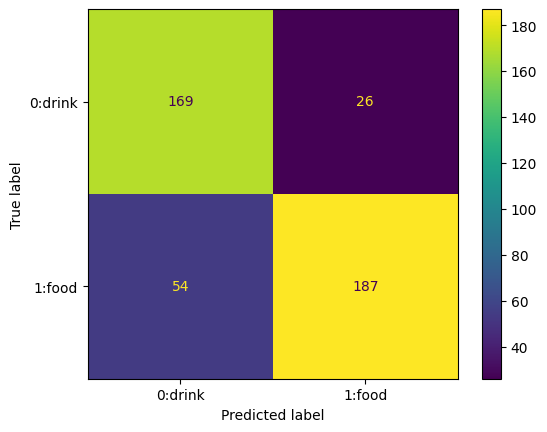

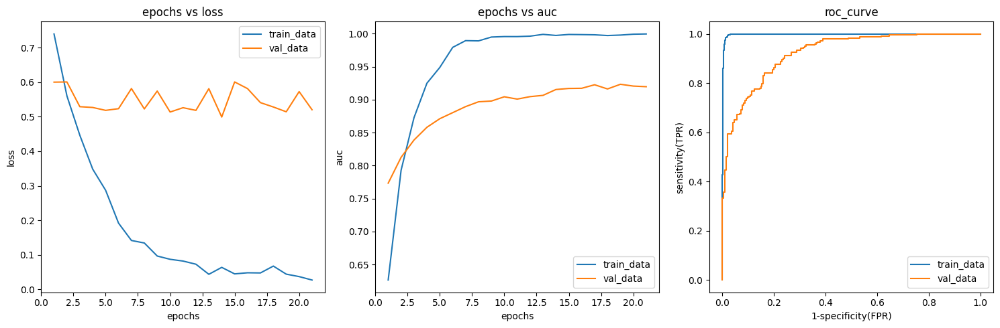

閾値0.5よりも高いものは"1"、低いもの"0"とする(青字は予測を外しているもの)


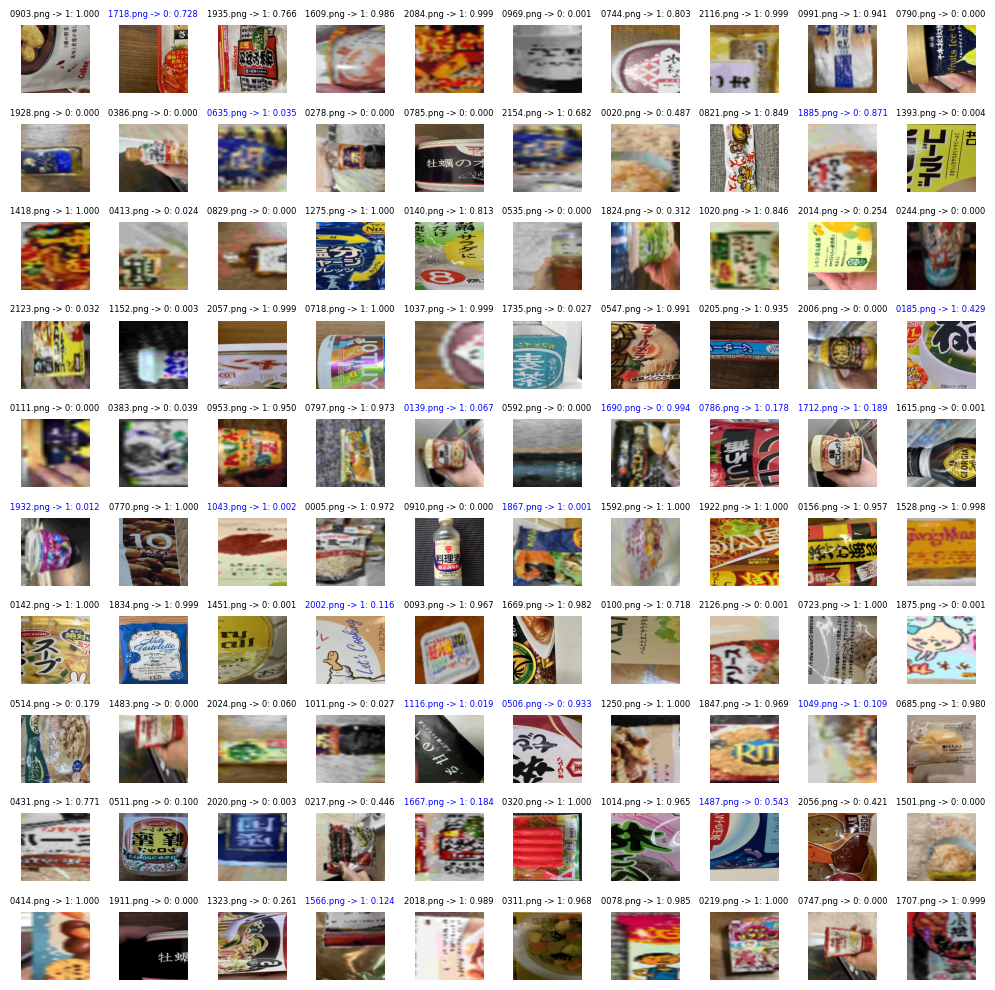

========================== 2fold ==========================


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNeXt101_32X8D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt101_32X8D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [1/100], loss: 0.73098 auc: 0.64871 val_loss: 0.62025, val_auc: 0.70893


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [2/100], loss: 0.56715 auc: 0.79043 val_loss: 0.55621, val_auc: 0.76977


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [3/100], loss: 0.44890 auc: 0.86989 val_loss: 0.52075, val_auc: 0.80712


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [4/100], loss: 0.38106 auc: 0.90719 val_loss: 0.49467, val_auc: 0.83402


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [5/100], loss: 0.30002 auc: 0.94394 val_loss: 0.47483, val_auc: 0.85530


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [6/100], loss: 0.22810 auc: 0.96880 val_loss: 0.47905, val_auc: 0.86262


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [7/100], loss: 0.18635 auc: 0.97987 val_loss: 0.46984, val_auc: 0.87222


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [8/100], loss: 0.12029 auc: 0.99141 val_loss: 0.49384, val_auc: 0.87899


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [9/100], loss: 0.10555 auc: 0.99343 val_loss: 0.49179, val_auc: 0.88156


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [10/100], loss: 0.09850 auc: 0.99355 val_loss: 0.52060, val_auc: 0.88126


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [11/100], loss: 0.09920 auc: 0.99374 val_loss: 0.50049, val_auc: 0.89099


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [12/100], loss: 0.07044 auc: 0.99656 val_loss: 0.48562, val_auc: 0.89619


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [13/100], loss: 0.05956 auc: 0.99783 val_loss: 0.48826, val_auc: 0.89693


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [14/100], loss: 0.06844 auc: 0.99671 val_loss: 0.46007, val_auc: 0.91095


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [15/100], loss: 0.04659 auc: 0.99839 val_loss: 0.47748, val_auc: 0.91048


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [16/100], loss: 0.03539 auc: 0.99936 val_loss: 0.47796, val_auc: 0.90848


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [17/100], loss: 0.04720 auc: 0.99858 val_loss: 0.47756, val_auc: 0.91190


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [18/100], loss: 0.04532 auc: 0.99856 val_loss: 0.48359, val_auc: 0.91078


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [19/100], loss: 0.04456 auc: 0.99827 val_loss: 0.49974, val_auc: 0.90965


  0%|          | 0/109 [00:00<?, ?it/s]

Early stopping


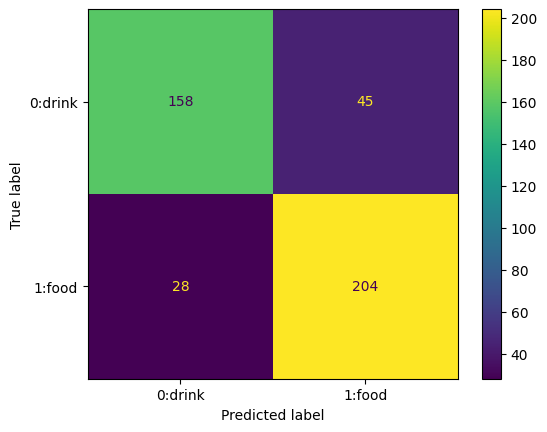

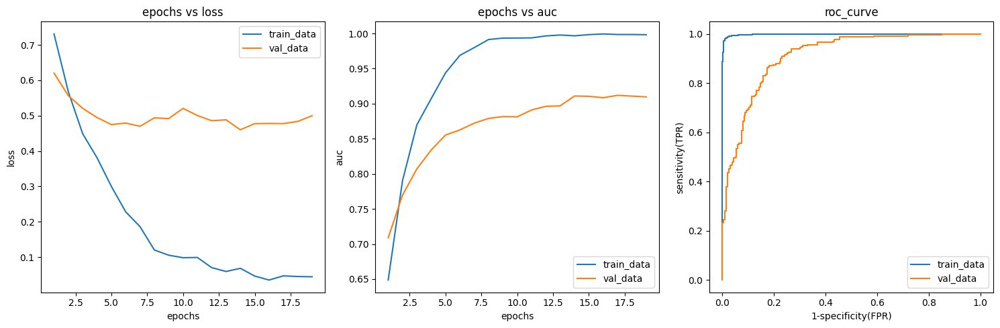

閾値0.5よりも高いものは"1"、低いもの"0"とする(青字は予測を外しているもの)


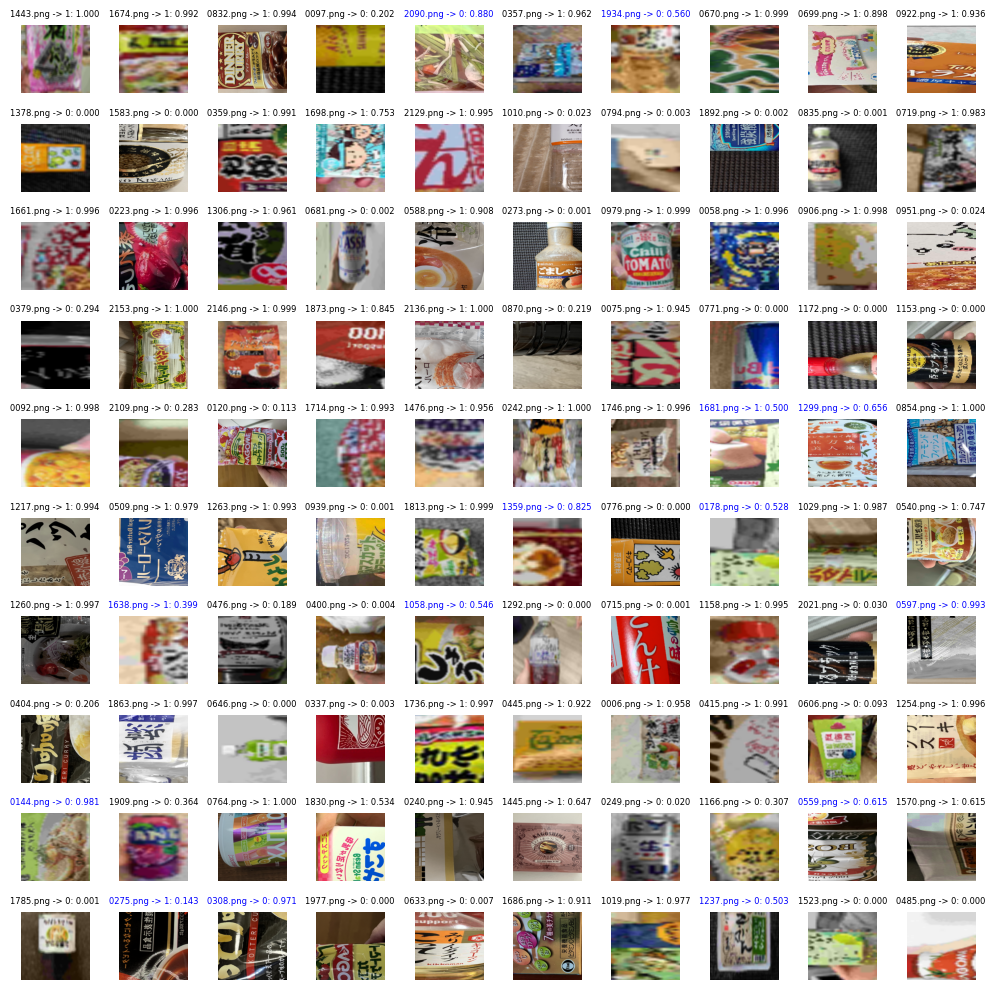

========================== 3fold ==========================


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNeXt101_32X8D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt101_32X8D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [1/100], loss: 0.75666 auc: 0.61570 val_loss: 0.59393, val_auc: 0.77105


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [2/100], loss: 0.57614 auc: 0.78124 val_loss: 0.54003, val_auc: 0.81916


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [3/100], loss: 0.48637 auc: 0.84919 val_loss: 0.47712, val_auc: 0.86480


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [4/100], loss: 0.38816 auc: 0.90577 val_loss: 0.45886, val_auc: 0.87030


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [5/100], loss: 0.31782 auc: 0.93776 val_loss: 0.44246, val_auc: 0.88431


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [6/100], loss: 0.24396 auc: 0.96514 val_loss: 0.44598, val_auc: 0.89288


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [7/100], loss: 0.18460 auc: 0.98072 val_loss: 0.39743, val_auc: 0.90818


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [8/100], loss: 0.16053 auc: 0.98517 val_loss: 0.47529, val_auc: 0.89686


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [9/100], loss: 0.12263 auc: 0.99150 val_loss: 0.43432, val_auc: 0.91226


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [10/100], loss: 0.09350 auc: 0.99440 val_loss: 0.41738, val_auc: 0.91376


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [11/100], loss: 0.09628 auc: 0.99436 val_loss: 0.41988, val_auc: 0.91541


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [12/100], loss: 0.08048 auc: 0.99586 val_loss: 0.42447, val_auc: 0.91865


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [13/100], loss: 0.06417 auc: 0.99683 val_loss: 0.43564, val_auc: 0.91892


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [14/100], loss: 0.04888 auc: 0.99873 val_loss: 0.40379, val_auc: 0.92601


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [15/100], loss: 0.06206 auc: 0.99774 val_loss: 0.45785, val_auc: 0.92212


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [16/100], loss: 0.06650 auc: 0.99669 val_loss: 0.39037, val_auc: 0.93041


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [17/100], loss: 0.05257 auc: 0.99833 val_loss: 0.47890, val_auc: 0.92527


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [18/100], loss: 0.05170 auc: 0.99846 val_loss: 0.39895, val_auc: 0.93255


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [19/100], loss: 0.04080 auc: 0.99902 val_loss: 0.39005, val_auc: 0.93450


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [20/100], loss: 0.06315 auc: 0.99734 val_loss: 0.45402, val_auc: 0.93606


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [21/100], loss: 0.04298 auc: 0.99875 val_loss: 0.35465, val_auc: 0.94400


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [22/100], loss: 0.04447 auc: 0.99885 val_loss: 0.42501, val_auc: 0.93663


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [23/100], loss: 0.03472 auc: 0.99920 val_loss: 0.36859, val_auc: 0.94391


  0%|          | 0/109 [00:00<?, ?it/s]

Early stopping


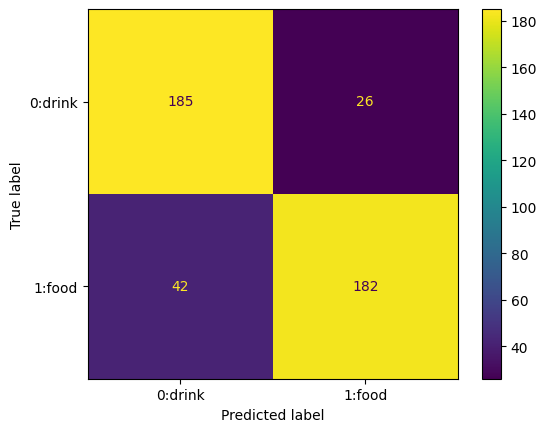

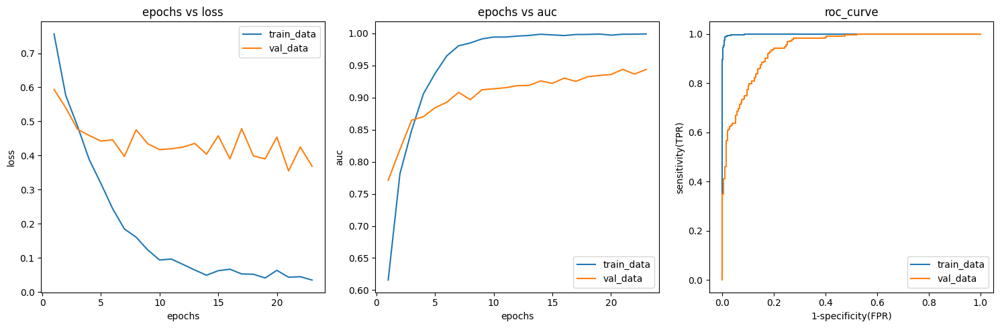

閾値0.5よりも高いものは"1"、低いもの"0"とする(青字は予測を外しているもの)


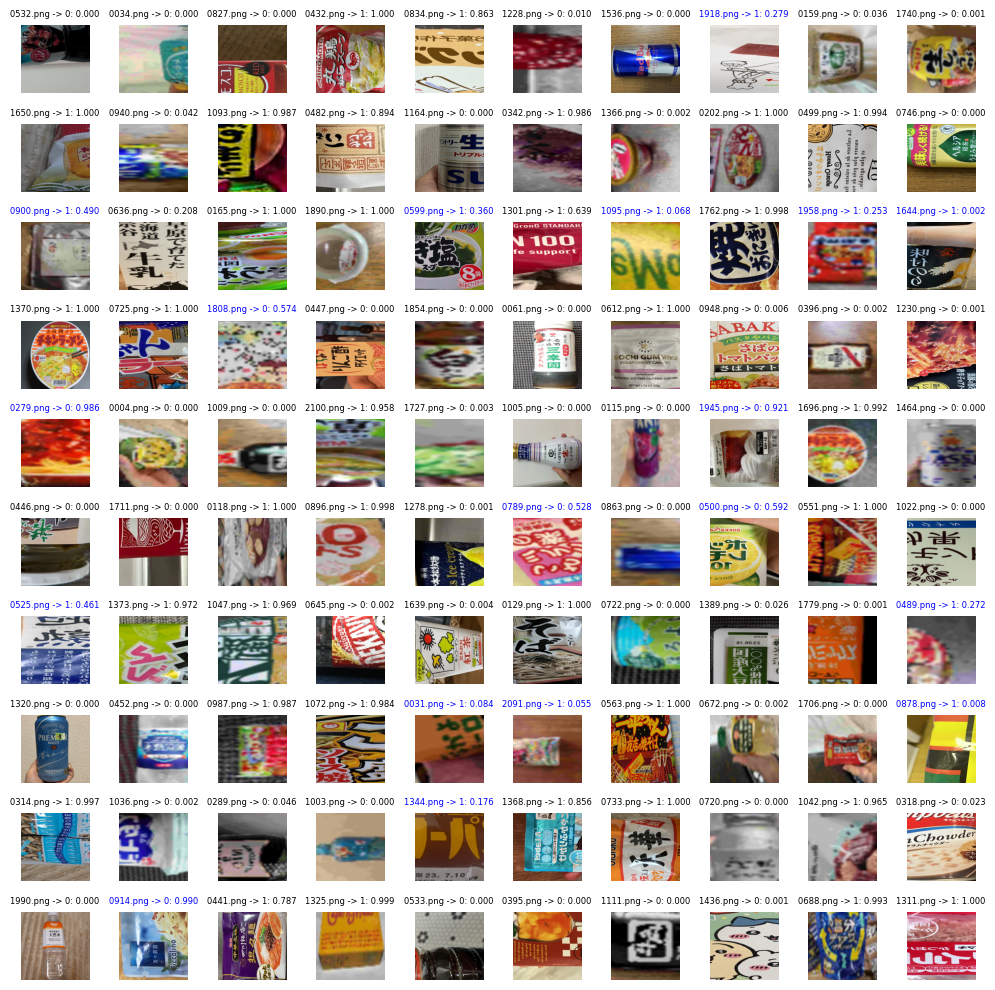

========================== 4fold ==========================


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNeXt101_32X8D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt101_32X8D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [1/100], loss: 0.75295 auc: 0.62622 val_loss: 0.61478, val_auc: 0.74372


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [2/100], loss: 0.54214 auc: 0.80571 val_loss: 0.56564, val_auc: 0.78819


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [3/100], loss: 0.46180 auc: 0.86260 val_loss: 0.54106, val_auc: 0.81687


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [4/100], loss: 0.34922 auc: 0.92429 val_loss: 0.51956, val_auc: 0.84138


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [5/100], loss: 0.25505 auc: 0.96221 val_loss: 0.51551, val_auc: 0.85360


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [6/100], loss: 0.20632 auc: 0.97420 val_loss: 0.54468, val_auc: 0.85056


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [7/100], loss: 0.17156 auc: 0.98342 val_loss: 0.51461, val_auc: 0.86927


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [8/100], loss: 0.14258 auc: 0.98790 val_loss: 0.52510, val_auc: 0.87841


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [9/100], loss: 0.09975 auc: 0.99451 val_loss: 0.55481, val_auc: 0.87691


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [10/100], loss: 0.07442 auc: 0.99709 val_loss: 0.54063, val_auc: 0.88572


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [11/100], loss: 0.07897 auc: 0.99620 val_loss: 0.58598, val_auc: 0.88131


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [12/100], loss: 0.07956 auc: 0.99552 val_loss: 0.61898, val_auc: 0.88027


  0%|          | 0/109 [00:00<?, ?it/s]

Early stopping


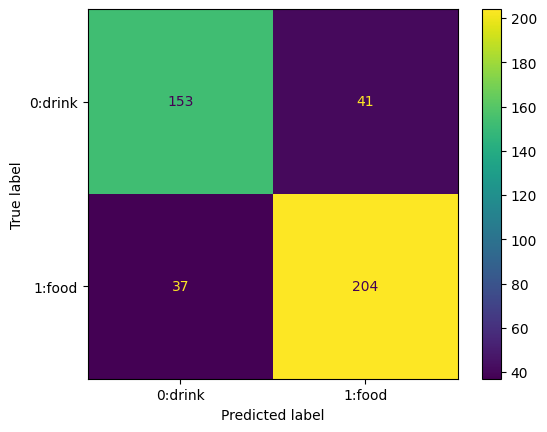

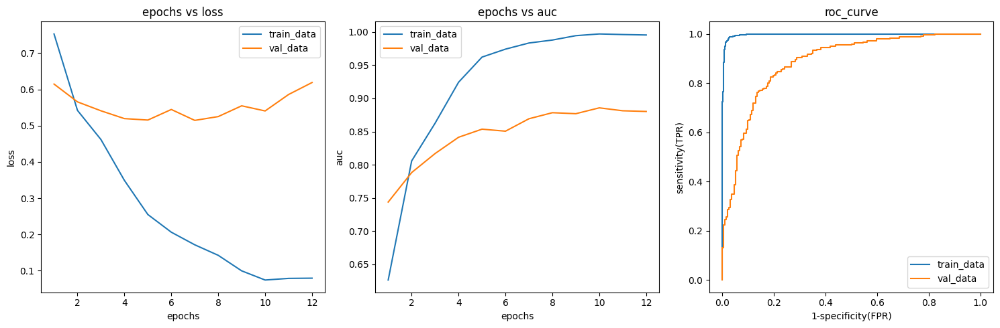

閾値0.5よりも高いものは"1"、低いもの"0"とする(青字は予測を外しているもの)


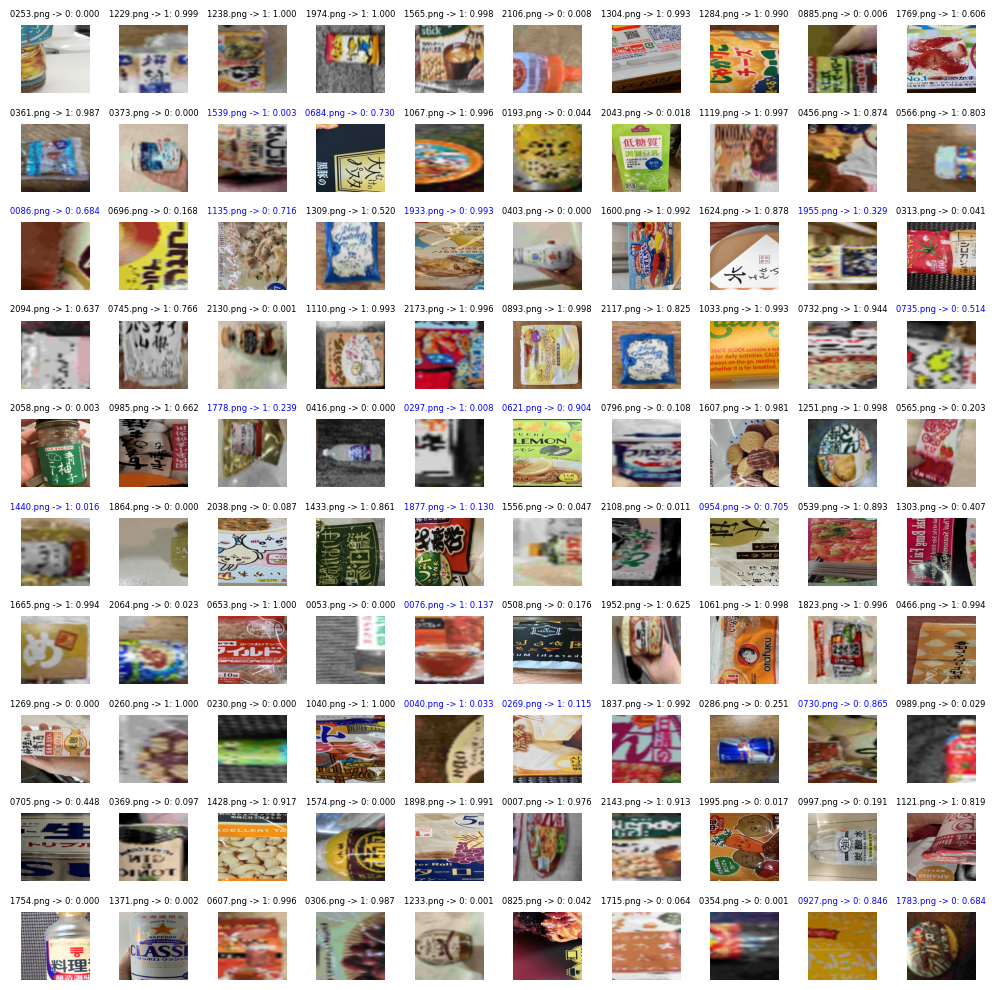

========================== 5fold ==========================


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNeXt101_32X8D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt101_32X8D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [1/100], loss: 0.74094 auc: 0.62537 val_loss: 0.55388, val_auc: 0.79884


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [2/100], loss: 0.58322 auc: 0.77496 val_loss: 0.47991, val_auc: 0.84579


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [3/100], loss: 0.45353 auc: 0.86817 val_loss: 0.49187, val_auc: 0.85913


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [4/100], loss: 0.35975 auc: 0.91841 val_loss: 0.42100, val_auc: 0.88179


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [5/100], loss: 0.28768 auc: 0.95046 val_loss: 0.43266, val_auc: 0.89267


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [6/100], loss: 0.22449 auc: 0.97037 val_loss: 0.42375, val_auc: 0.89806


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [7/100], loss: 0.17090 auc: 0.98308 val_loss: 0.41906, val_auc: 0.90501


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [8/100], loss: 0.13462 auc: 0.98932 val_loss: 0.44522, val_auc: 0.90939


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [9/100], loss: 0.10876 auc: 0.99337 val_loss: 0.42604, val_auc: 0.91299


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [10/100], loss: 0.09080 auc: 0.99498 val_loss: 0.45689, val_auc: 0.91406


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [11/100], loss: 0.09481 auc: 0.99378 val_loss: 0.47382, val_auc: 0.91653


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [12/100], loss: 0.07990 auc: 0.99570 val_loss: 0.47457, val_auc: 0.91606


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [13/100], loss: 0.07010 auc: 0.99709 val_loss: 0.45765, val_auc: 0.91760


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [14/100], loss: 0.05881 auc: 0.99771 val_loss: 0.51433, val_auc: 0.91177


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [15/100], loss: 0.05176 auc: 0.99827 val_loss: 0.47953, val_auc: 0.91977


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [16/100], loss: 0.07049 auc: 0.99635 val_loss: 0.46405, val_auc: 0.92348


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [17/100], loss: 0.05474 auc: 0.99788 val_loss: 0.46795, val_auc: 0.92284


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [18/100], loss: 0.03906 auc: 0.99931 val_loss: 0.46050, val_auc: 0.92529


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [19/100], loss: 0.04426 auc: 0.99857 val_loss: 0.45507, val_auc: 0.92893


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [20/100], loss: 0.05904 auc: 0.99768 val_loss: 0.50609, val_auc: 0.93033


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [21/100], loss: 0.04550 auc: 0.99876 val_loss: 0.42858, val_auc: 0.93511


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [22/100], loss: 0.04704 auc: 0.99861 val_loss: 0.48240, val_auc: 0.92844


  0%|          | 0/109 [00:00<?, ?it/s]

Epoch [23/100], loss: 0.05487 auc: 0.99808 val_loss: 0.44734, val_auc: 0.92951


  0%|          | 0/109 [00:00<?, ?it/s]

Early stopping


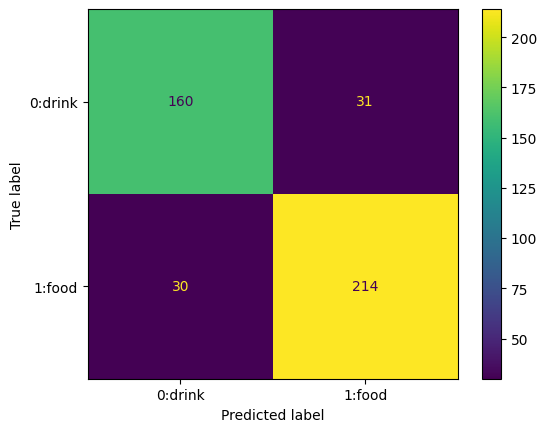

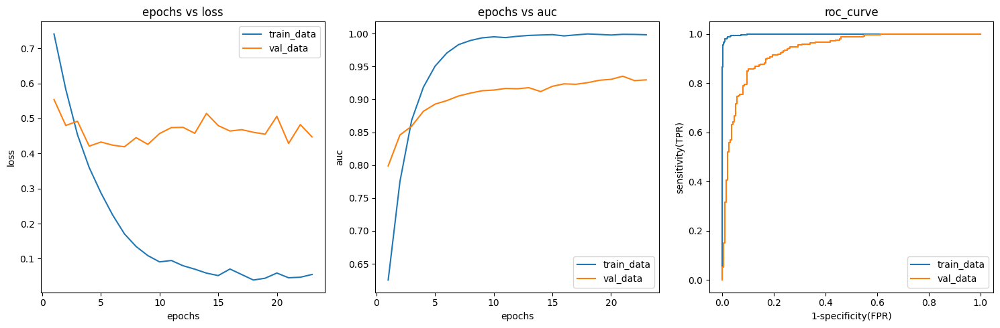

閾値0.5よりも高いものは"1"、低いもの"0"とする(青字は予測を外しているもの)


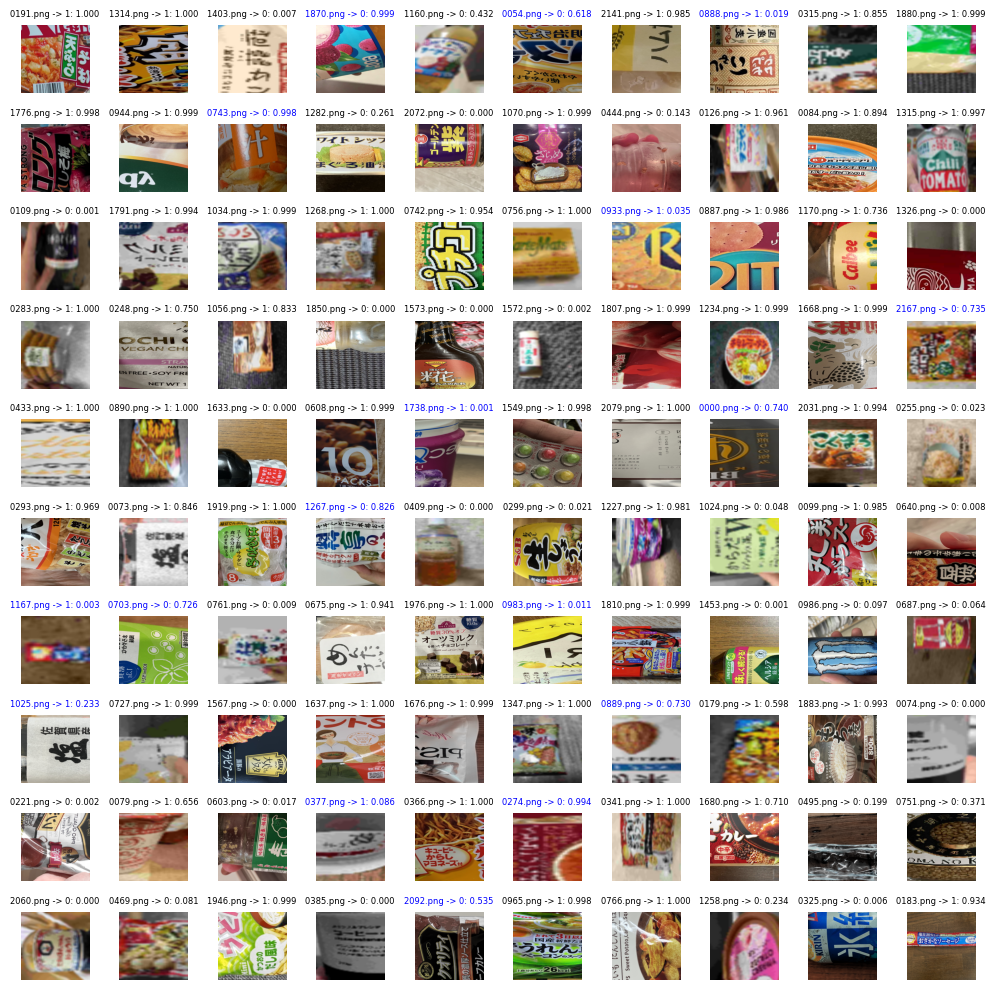

In [ ]:
# 乱数初期化
torch_seed()

# バッチサイズ
train_batch_size = 32
test_batch_size = 128

# エポック数
num_epochs = 100

# データローダーのためのカスタムデータセットクラス
class ImageFolderWithPaths(datasets.ImageFolder):

  # 指定されたインデックスのデータアイテムを返すメソッド
  def __getitem__(self, index):
    # 通常のImageFolderの出力(画像データとラベル)を取得
    original_tuple = super(ImageFolderWithPaths, self).__getitem__(index)
    # ファイルパスを取得
    path = self.imgs[index][0]
    # 元のタプルにパスを追加
    tuple_with_path = original_tuple + (path,)
    return tuple_with_path

# データセットをロード
train_dataset = ImageFolderWithPaths(train_dir, transform=train_transform)
val_dataset = ImageFolderWithPaths(train_dir, transform=test_transform)

# 5Fold
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
for fold, (trn_idx, val_idx) in enumerate(cv.split(train_df['image_name'], train_df['label'])):

  print(f'========================== {fold+1}fold ==========================')
  # この中にログを保存
  history = np.zeros([0, 5])
  # 関数の呼び出し
  net = create_new_network()
  criterion, optimizer = create_new_optimizer(net)

  # インデックスに対応したデータのみ抽出
  train_data = Subset(train_dataset, trn_idx)
  val_data = Subset(val_dataset, val_idx)

  # データローダー定義（訓練用）
  train_loader = DataLoader(train_data, batch_size=train_batch_size, shuffle=True)
  # データローダー定義（検証用）
  val_loader = DataLoader(val_data, batch_size=test_batch_size, shuffle=False)
  # モデルの学習
  history, result_df, best_train_fpr, best_train_tpr, best_val_fpr, best_val_tpr, cm = fit(net, criterion, optimizer, num_epochs, train_loader, val_loader, device, history, base_dir, fold)
  # 学習曲線を描画
  learning_curve_and_confusion_matrix(history, best_train_fpr, best_train_tpr, best_val_fpr, best_val_tpr, cm)
  # 検証データの画像と予測結果の出力
  print('閾値0.5よりも高いものは"1"、低いもの"0"とする(青字は予測を外しているもの)')
  show_images_labels(val_loader, result_df)

In [ ]:
# バッチサイズ
test_batch_size = 100
# データセットをロード
test_data = datasets.ImageFolder(test_dir, transform=test_transform)
# データローダー
test_loader = DataLoader(test_data, batch_size=test_batch_size, shuffle=False)
# テストデータへの適用
test_pred_proba = predict(test_loader, device, base_dir)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNeXt101_32X8D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt101_32X8D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
# submit
submit = pd.read_csv(os.path.join(base_dir, 'sample_submit.csv'), header=None)
submit[1] = test_pred_proba
submit.to_csv(os.path.join(base_dir, 'submit_0915.csv'), index=None, header=None)

In [ ]:
submit

,0,1
0,2176.png,0.820610
1,2177.png,0.949894
2,2178.png,0.078434
3,2179.png,0.999798
4,2180.png,0.000016
...,...,...
2175,4351.png,0.000301
2176,4352.png,0.000036
2177,4353.png,0.515025
2178,4354.png,0.047032


<Axes: xlabel='1', ylabel='Count'>

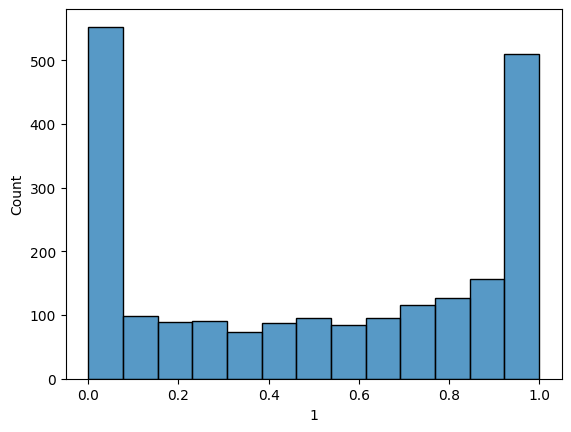

In [ ]:
sns.histplot(submit[1])